In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [2]:
df = pd.read_csv("DataMiningFinal/all_games.csv", encoding='latin-1')

In [3]:
df.columns

Index(['name', 'platform', 'release_date', 'summary', 'meta_score',
       'user_review'],
      dtype='object')

In [4]:
df.head()

,name,platform,release_date,summary,meta_score,user_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998","As a young boy, Link is tricked by Ganondorf, ...",99,9.1
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",As most major publishers' development efforts ...,98,7.4
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",[Metacritic's 2008 PS3 Game of the Year; Also ...,98,7.7
3,SoulCalibur,Dreamcast,"September 8, 1999","This is a tale of souls and swords, transcendi...",98,8.4
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",[Metacritic's 2008 Xbox 360 Game of the Year; ...,98,7.9


In [5]:
char = df[["name", "platform", "release_date", "meta_score", "user_review"]]

In [6]:
char.isnull().sum()
print(df.dtypes)

name            object
platform        object
release_date    object
summary         object
meta_score       int64
user_review     object
dtype: object


In [7]:
df['user_review'] = (df['user_review'].str.split()).apply(lambda x: float(x[0].replace('tbd', "-1")))

In [8]:
df['rounded_review'] = df['user_review'].round(0).astype(int)

In [9]:
df

,name,platform,release_date,summary,meta_score,user_review,rounded_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998","As a young boy, Link is tricked by Ganondorf, ...",99,9.1,9
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",As most major publishers' development efforts ...,98,7.4,7
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",[Metacritic's 2008 PS3 Game of the Year; Also ...,98,7.7,8
3,SoulCalibur,Dreamcast,"September 8, 1999","This is a tale of souls and swords, transcendi...",98,8.4,8
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",[Metacritic's 2008 Xbox 360 Game of the Year; ...,98,7.9,8
...,...,...,...,...,...,...,...
18795,Fast & Furious: Showdown,Xbox 360,"May 21, 2013",Fast & Furious: Showdown takes some of the fra...,22,1.3,1
18796,Drake of the 99 Dragons,Xbox,"November 3, 2003",Drake is out for revenge in a supernatural Hon...,22,1.7,2
18797,Afro Samurai 2: Revenge of Kuma Volume One,PlayStation 4,"September 22, 2015","Head out on a journey of redemption, driven by...",21,2.9,3
18798,Infestation: Survivor Stories (The War Z),PC,"October 15, 2012","(Formerly known as ""The War Z"") It has been 5 ...",20,1.7,2


In [10]:
df.query("not rounded_review < 0")

,name,platform,release_date,summary,meta_score,user_review,rounded_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998","As a young boy, Link is tricked by Ganondorf, ...",99,9.1,9
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",As most major publishers' development efforts ...,98,7.4,7
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",[Metacritic's 2008 PS3 Game of the Year; Also ...,98,7.7,8
3,SoulCalibur,Dreamcast,"September 8, 1999","This is a tale of souls and swords, transcendi...",98,8.4,8
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",[Metacritic's 2008 Xbox 360 Game of the Year; ...,98,7.9,8
...,...,...,...,...,...,...,...
18795,Fast & Furious: Showdown,Xbox 360,"May 21, 2013",Fast & Furious: Showdown takes some of the fra...,22,1.3,1
18796,Drake of the 99 Dragons,Xbox,"November 3, 2003",Drake is out for revenge in a supernatural Hon...,22,1.7,2
18797,Afro Samurai 2: Revenge of Kuma Volume One,PlayStation 4,"September 22, 2015","Head out on a journey of redemption, driven by...",21,2.9,3
18798,Infestation: Survivor Stories (The War Z),PC,"October 15, 2012","(Formerly known as ""The War Z"") It has been 5 ...",20,1.7,2


In [11]:
df = df.query("not rounded_review < 0")

In [12]:
char = df[["name", "platform", "release_date", "meta_score", "user_review", "rounded_review"]]

<Axes: xlabel='meta_score', ylabel='rounded_review'>

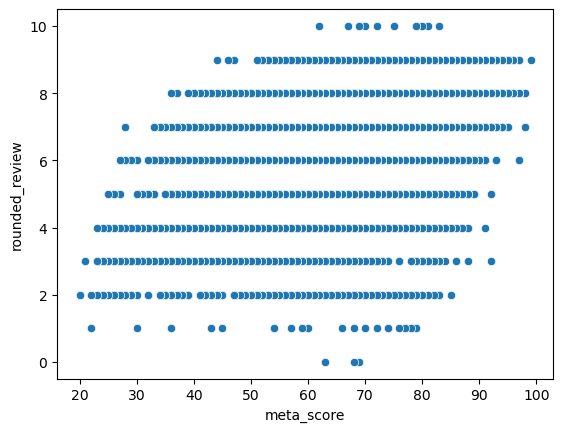

In [13]:
sns.scatterplot(x='meta_score', y='rounded_review', data=char)

In [14]:
##Visualization

In [15]:
X = char[['meta_score','rounded_review']]

In [16]:
pca = PCA(n_components=2)
pca_mdl = pca.fit_transform(X)
pca_df = pd.DataFrame(pca_mdl)

<Axes: xlabel='0', ylabel='1'>

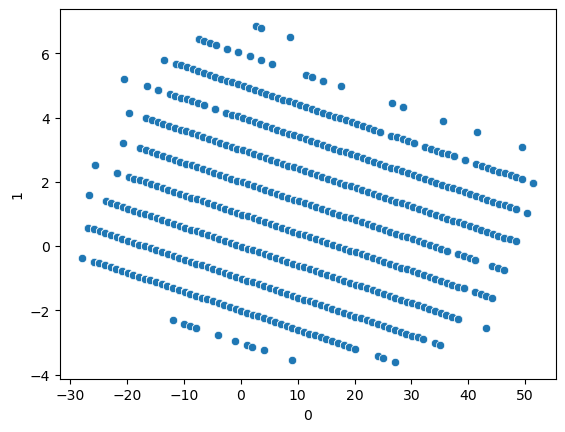

In [17]:
sns.scatterplot(x = pca_df[0], y = pca_df[1])

<Axes: xlabel='0', ylabel='1'>

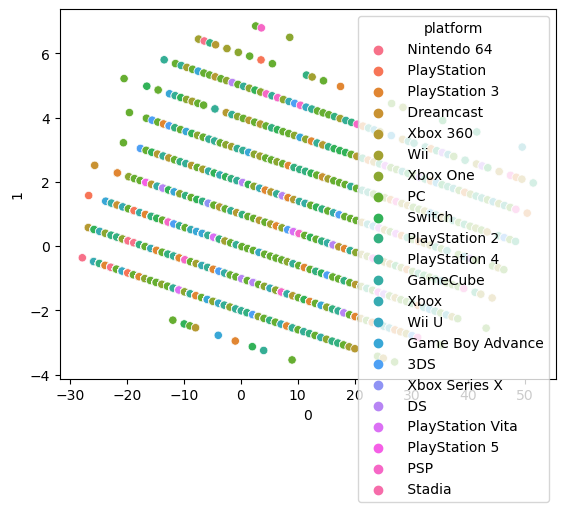

In [18]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=char.platform)

In [19]:
##Clustering
inertia = []
for k in range(1,8):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(X)
    inertia.append(np.sqrt(kmeans.inertia_))

C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of

Text(0, 0.5, 'Variance')

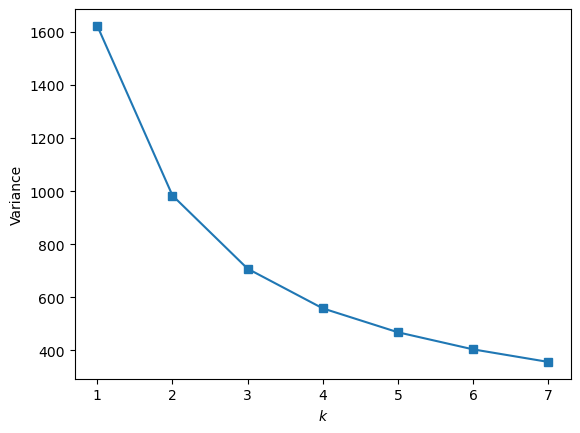

In [20]:
plt.plot(range(1, 8), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')

In [21]:
#create KMeans model
kmeans = KMeans(n_clusters=2, random_state=1).fit(X)
y = kmeans.fit_predict(X)

C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\astah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Axes: xlabel='0', ylabel='1'>

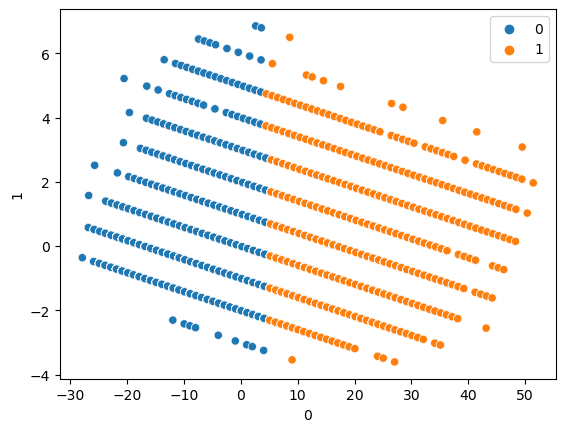

In [22]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y)

<Axes: xlabel='meta_score', ylabel='rounded_review'>

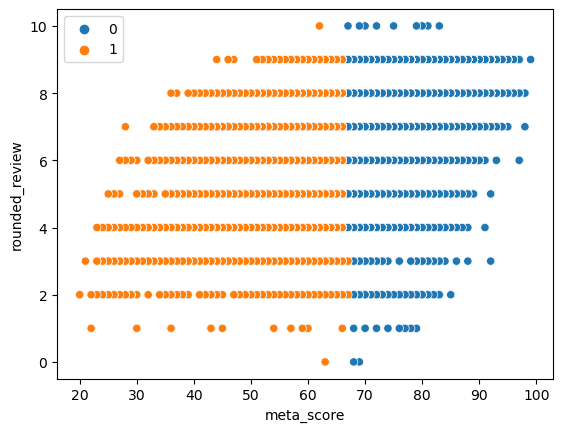

In [23]:
sns.scatterplot(x = char['meta_score'], y = char['rounded_review'], hue=y)

In [24]:
y_df = pd.DataFrame(y, columns=['Cluster'])
new_df = pd.concat([char, y_df], axis=1)

In [25]:
pca_df

,0,1
0,-27.870253,-0.363021
1,-26.754053,1.574528
2,-26.813023,0.576268
3,-26.813023,0.576268
4,-26.813023,0.576268
...,...,...
17430,49.467509,3.082341
17431,49.408539,2.084081
17432,50.347828,1.026851
17433,51.405058,1.966141


In [26]:
import plotly.express as px

In [27]:
fig = px.scatter(pd.concat([new_df, pca_df], axis = 1), 
                 x = 0, y = 1, color='Cluster', hover_data=["name", "platform", "release_date", "meta_score", "rounded_review"])
fig.show()

In [28]:
## Linear Regression

In [29]:
char.head()

,name,platform,release_date,meta_score,user_review,rounded_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998",99,9.1,9
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",98,7.4,7
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",98,7.7,8
3,SoulCalibur,Dreamcast,"September 8, 1999",98,8.4,8
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",98,7.9,8


In [30]:
char = char.drop(columns=['name', "platform", "release_date"])

In [31]:
x = char.drop(columns=['meta_score'])
y = char['meta_score']

In [71]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [72]:
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [73]:
y_pred_exp1 = model.predict(x_test)

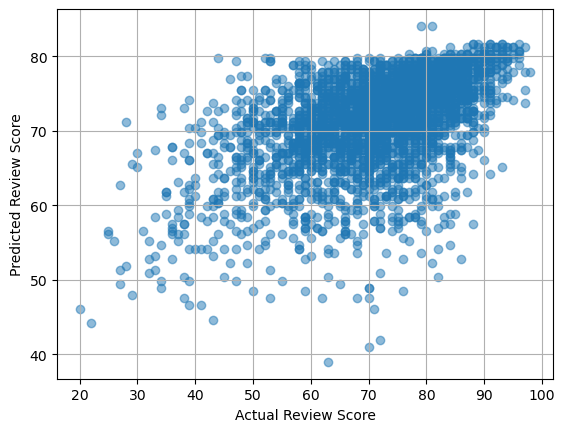

In [74]:
plt.scatter(y_test, y_pred_exp1, alpha=0.5)
plt.xlabel("Actual Review Score")
plt.ylabel("Predicted Review Score")
plt.grid(True)

<Axes: >

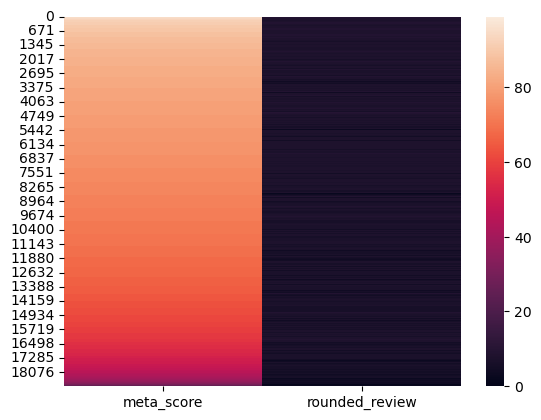

In [60]:
sns.heatmap(df[['meta_score', 'rounded_review']])

In [61]:
df['rounded_official'] = df['meta_score'].div(10)

C:\Users\astah\AppData\Local\Temp\ipykernel_10700\3755095921.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
from sklearn.metrics import mean_squared_error, r2_score

In [69]:
mean_exp1 = mean_squared_error(y_test, y_pred_exp1, squared = False)
r2_exp1 = r2_score(y_test, y_pred_exp1)

In [70]:
print("Mean Squared Error for Experement: ", mean_exp1)
print("R2 Score for Experement: ", r2_exp1)

Mean Squared Error for Experement:  8.688398126381168
R2 Score for Experement:  0.41695593457247515
